# Import libraries

In [1]:
import os
import sys

# Add the root directory to Python path so that we can import the modules
root_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.append(root_dir)

In [2]:
import torch
import matplotlib.pyplot as plt
from torchgeo.transforms import AugmentationSequential
import kornia.augmentation as K
from torchgeo.datasets.utils import stack_samples
from lightning.pytorch import Trainer
from torchgeo.models import ResNet50_Weights
from torchgeo.trainers import SemanticSegmentationTask
from torch.utils.data import DataLoader
from pugs_detection.features import create_image_tiles, create_dataset_split
from pugs_detection.modeling.model import modify_first_layer
from pugs_detection.plots import plot_image_tiles, visualize_from_torchgeo_dataloader, visualize_predictions
from pugs_detection.utils import set_all_seeds

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Set seed to make it reproducible

In [3]:
# Set seeds for reproducibility
set_all_seeds(42)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


# Create image patches (Torchgeo)

## Create image tiles for training, validation, and test set

Manually specify tile

In [4]:
# train, validation, test index list
train_index_list = [3, 4, 6, 7, 11, 12, 13, 15, 16, 18, 19, 20, 22, 23, 25]
val_index_list = [2, 5, 9, 21, 24]
test_index_list = [1, 8, 10, 14, 17]
output_folder_path = '../data/processed/tiles'
image_path = '../data/processed/sentinel-2/stacked_sentinel2_dresden.geotiff'

In [5]:
all_tiles_list = create_image_tiles(output_folder_path, image_path, train_index_list, val_index_list, test_index_list)

width: 27470.0 height: 23010.0
tile width: 5494.0 tile height: 4602.0
Tile 1 saved to ../data/processed/tiles/test/tile_1.geotiff
Tile 2 saved to ../data/processed/tiles/val/tile_2.geotiff
Tile 3 saved to ../data/processed/tiles/train/tile_3.geotiff
Tile 4 saved to ../data/processed/tiles/train/tile_4.geotiff
Tile 5 saved to ../data/processed/tiles/val/tile_5.geotiff
Tile 6 saved to ../data/processed/tiles/train/tile_6.geotiff
Tile 7 saved to ../data/processed/tiles/train/tile_7.geotiff
Tile 8 saved to ../data/processed/tiles/test/tile_8.geotiff
Tile 9 saved to ../data/processed/tiles/val/tile_9.geotiff
Tile 10 saved to ../data/processed/tiles/test/tile_10.geotiff
Tile 11 saved to ../data/processed/tiles/train/tile_11.geotiff
Tile 12 saved to ../data/processed/tiles/train/tile_12.geotiff
Tile 13 saved to ../data/processed/tiles/train/tile_13.geotiff
Tile 14 saved to ../data/processed/tiles/test/tile_14.geotiff
Tile 15 saved to ../data/processed/tiles/train/tile_15.geotiff
Tile 16 saved

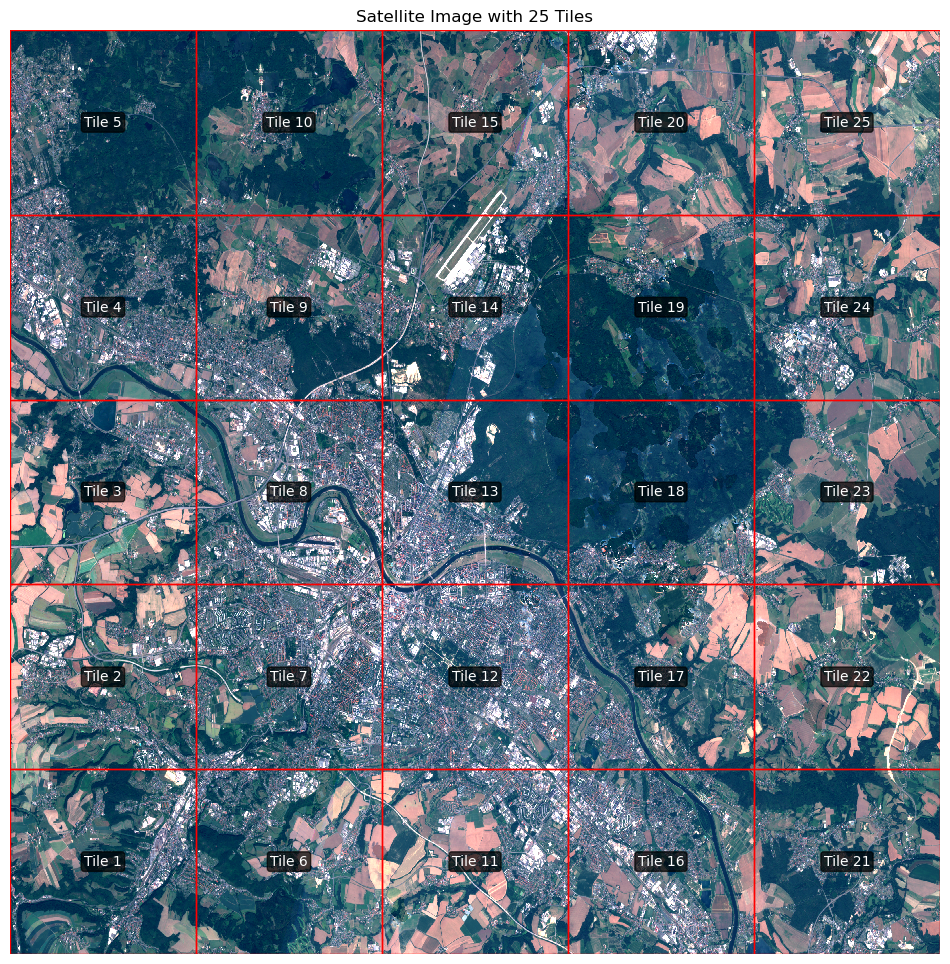

In [6]:
plot_image_tiles(image_path, all_tiles_list)

---

# Define functions for creating patches

In [7]:
import warnings

warnings.filterwarnings(
    "ignore", 
    message="You will likely lose important projection information when converting to a PROJ string from another format.*", 
    category=UserWarning
)

warnings.filterwarnings(
    "ignore",
    message="Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired.*",
    category=UserWarning
)

# Start create patches

In [8]:
# Define paths for pre-split tiles
train_image_path = '../data/processed/tiles/train'
val_image_path = '../data/processed/tiles/val'
test_image_path = '../data/processed/tiles/test'

In [9]:
# Vector data path
# label_path = '../data/processed/osm/public_green_spaces_dresden.geojson'
label_path = '../data/processed/ground truth/dresden_pugs_gt.geojson'

In [10]:
# # Create augmentation sequence
# # p parameter is the probability of applying the transformation
# transform_test = AugmentationSequential(
#     # Standard spatial augmentations
#     K.RandomHorizontalFlip(p=0.6),
#     K.RandomVerticalFlip(p=0.6),
#     K.RandomRotation(degrees=45, p=0.5, align_corners=True),
#     # Define which keys and indices to apply transformations to
#     data_keys=['image', 'mask']
# )

In [11]:
# Create specific augmentation transforms
h_flip_transform = AugmentationSequential(
    K.RandomHorizontalFlip(p=1.),
    data_keys=['image', 'mask']
)

v_flip_transform = AugmentationSequential(
    K.RandomVerticalFlip(p=1.),
    data_keys=['image', 'mask']
)

affine_transform = AugmentationSequential(
    K.RandomAffine(degrees=[-45., 45.], translate=[0., 0.1], scale=[1., 1.5], shear=[0., 0.15], p=1.),
    data_keys=['image', 'mask']
)

In [12]:
# Create list of specific transforms
transform_list = [h_flip_transform, v_flip_transform, affine_transform]

In [13]:
# band_list = [13,1,2,3,4,5,6,7,8,9,10,11,12] # 13 is osm binary mask
# band_list = [0,1,2,3,4,5,6,7,8,9,10,11,12,14]
# band_list = [0,1,2,3,4,5,6,7,8,9,10,11,12,13]

# band_list = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15]

# band_list = [1,2,3,4,5,6,7,11,12,13]
# band_list = [1,2,3,4,5,6,7,11,12]

band_list = [0,1,2,3,4,5,6,7,8,9,10,11,12]

## Training dataset

In [14]:
# Create the filtered datasets
train_dataset = create_dataset_split(train_image_path, label_path, 32633, band_list, 'train', transform_list)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
Found 180 valid patches out of 180 total patches


In [15]:
print(len(train_dataset))

720


In [16]:
# Create DataLoaders
batch_size = 16

train_loader = DataLoader(
    train_dataset, 
    batch_size=batch_size,
    shuffle=True,
    collate_fn=stack_samples,
    num_workers=3
)

In [17]:
len(train_loader)

45

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Sample 0:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.01


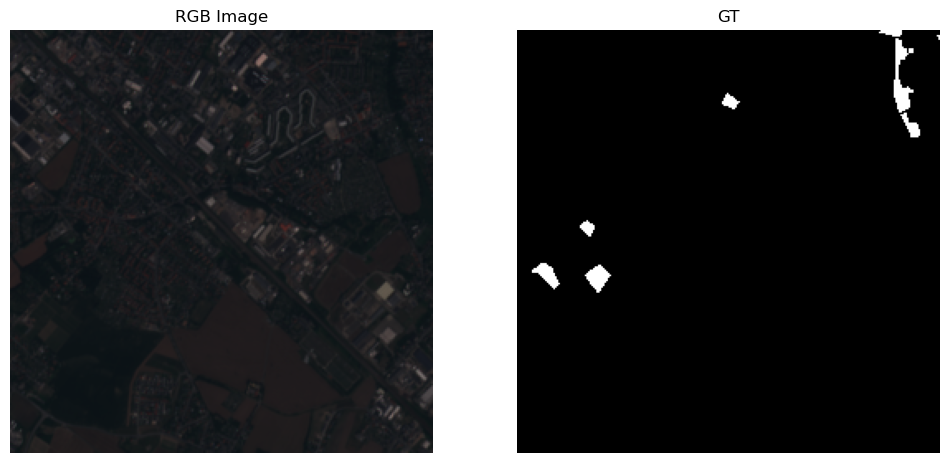

Sample 1:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.13


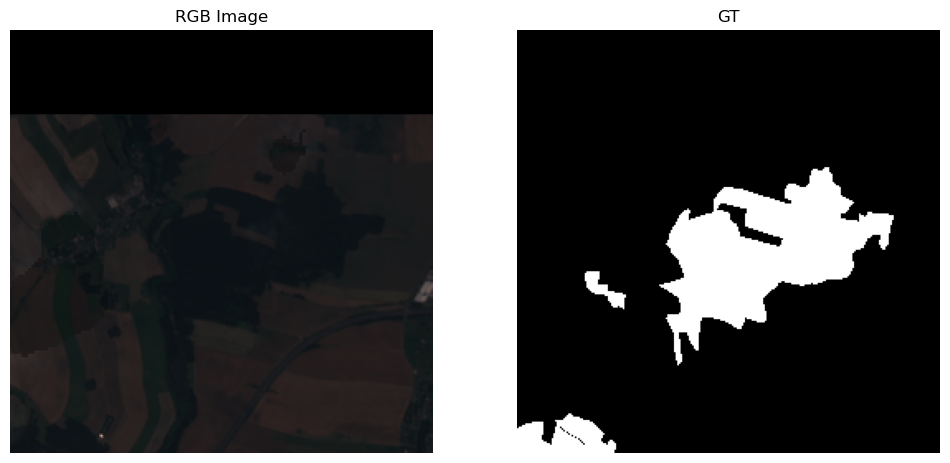

Sample 2:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.02


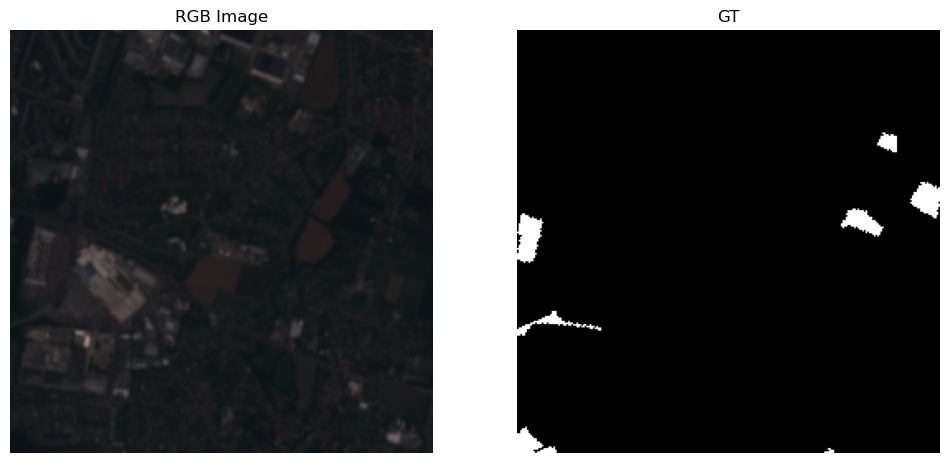

Sample 3:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.04


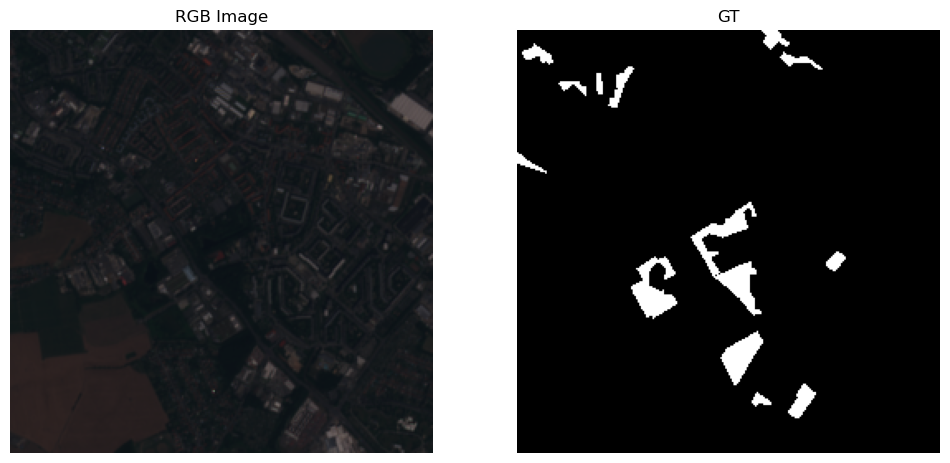

Sample 4:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.06


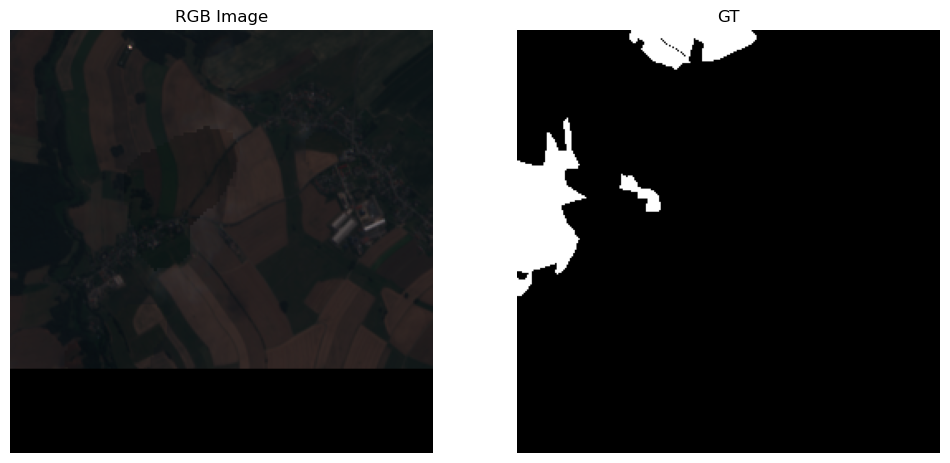

In [18]:
# visualize_from_torchgeo_dataloader(train_loader, 5, 'sdt', [13])
visualize_from_torchgeo_dataloader(train_loader, 5, 'original')

## Validation dataset

Set transform_sequence to None by default or optional params

In [19]:
val_dataset = create_dataset_split(val_image_path, label_path, 32633, band_list, 'validation', None)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Using all 60 patches for validation set


In [20]:
val_loader = DataLoader(
    val_dataset, 
    batch_size=batch_size,
    collate_fn=stack_samples,
    num_workers=2
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Sample 0:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.10


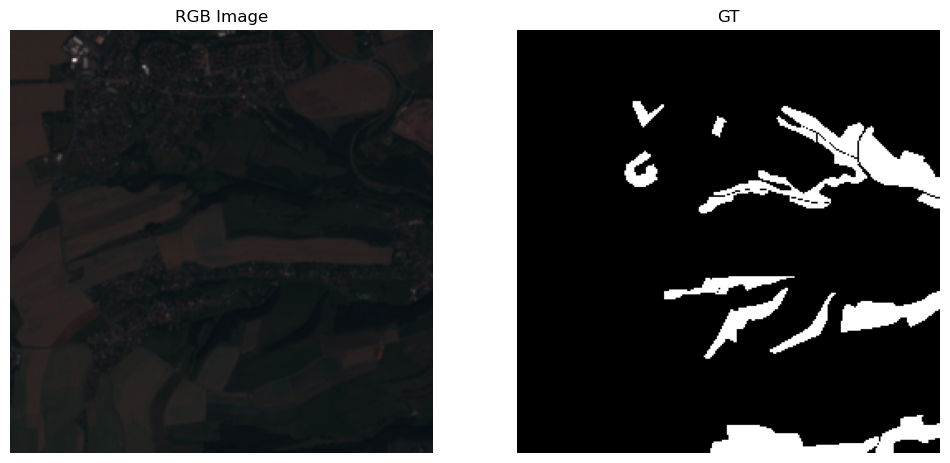

Sample 1:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.16


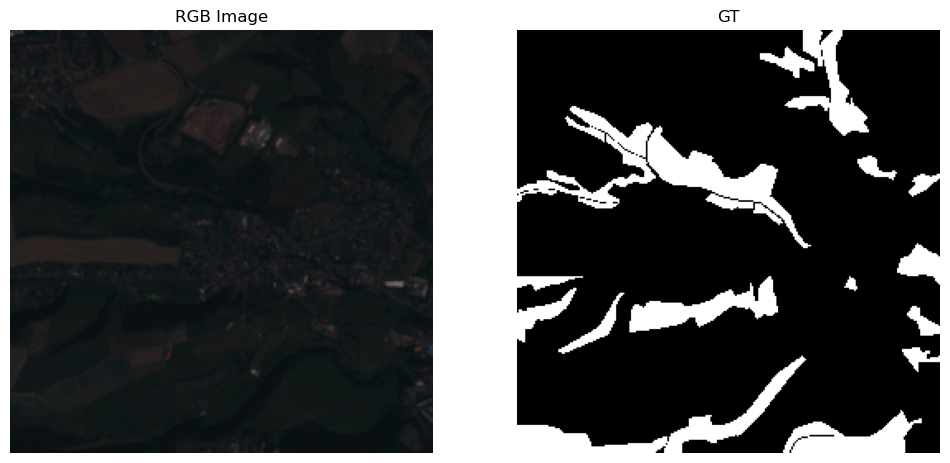

Sample 2:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.14


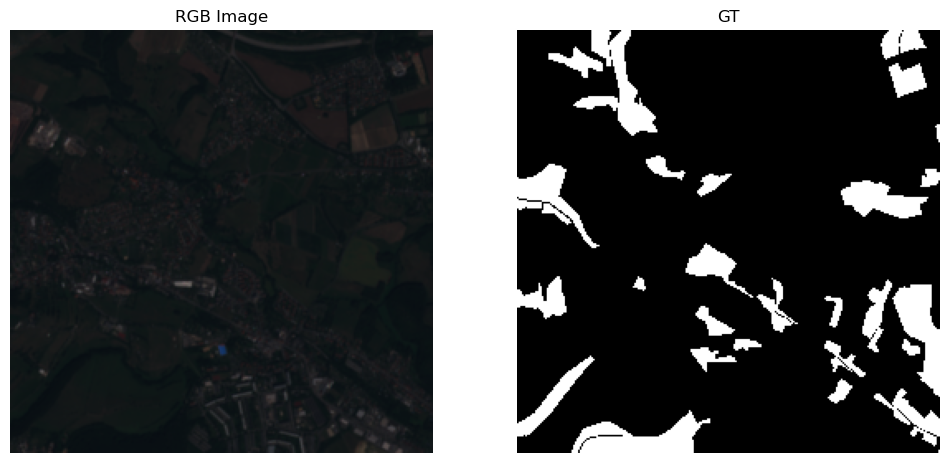

In [21]:
# visualize_from_torchgeo_dataloader(val_loader, 3, 'sdt', [13])
visualize_from_torchgeo_dataloader(val_loader, 3, 'original')

## Test dataset

Set transform_sequence to None by default or optional params

In [22]:
test_dataset = create_dataset_split(test_image_path, label_path, 32633, band_list, 'test', None)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Using all 60 patches for test set


In [23]:
test_loader = DataLoader(
    test_dataset, 
    batch_size=batch_size,
    collate_fn=stack_samples,
    num_workers=1
)

In [24]:
len(test_loader)

4

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Sample 0:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.37


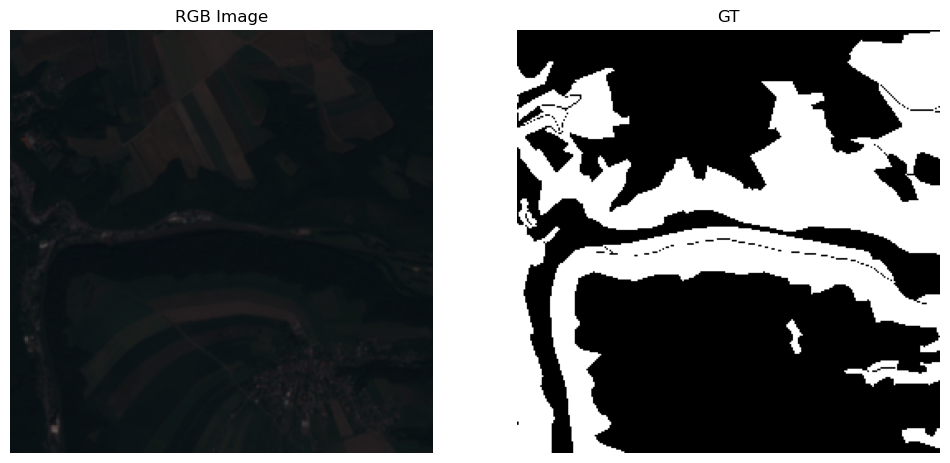

Sample 1:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.40


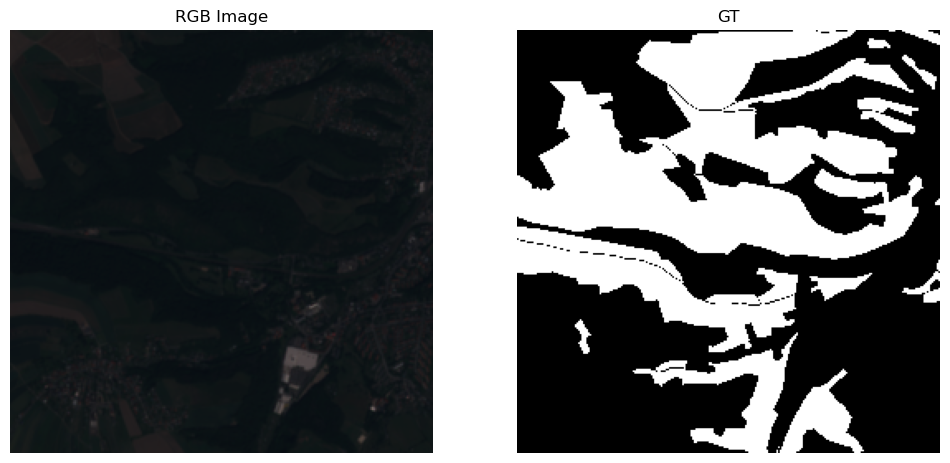

Sample 2:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.38


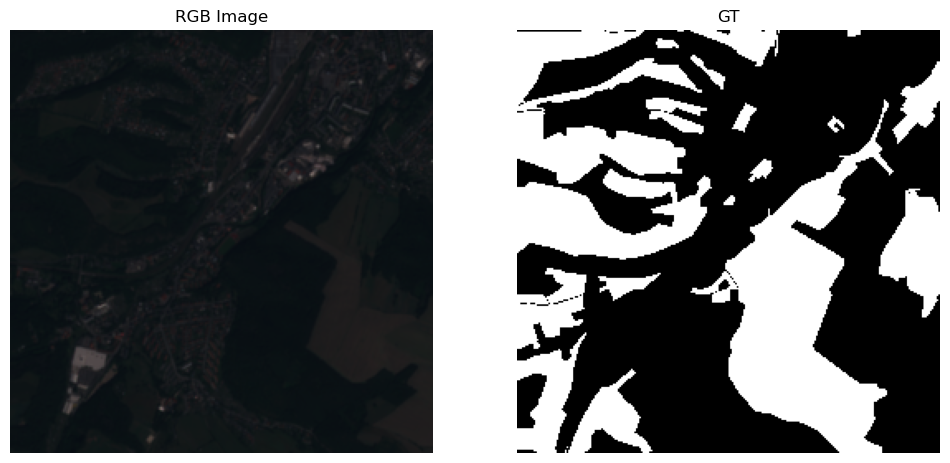

In [25]:
# visualize_from_torchgeo_dataloader(test_loader, 3, 'sdt', [13])
visualize_from_torchgeo_dataloader(test_loader, 3, 'original')

# Create and train model

In [26]:
# batch_size = 10
# num_workers = 2
# max_epochs = 10
# fast_dev_run = False

In [27]:
weight_test = ResNet50_Weights.SENTINEL2_ALL_MOCO
# weight_test = ResNet50_Weights.SENTINEL2_MI_MS_SATLAS

## Modified model

13 channels + OSM binary mask

In [28]:
# from typing import Any

# import kornia.augmentation as K
# import matplotlib.pyplot as plt
# import segmentation_models_pytorch as smp
# import torch.nn as nn
# from matplotlib.figure import Figure
# from torch import Tensor
# from torchmetrics import MetricCollection
# from torchmetrics.classification import MulticlassAccuracy, MulticlassJaccardIndex
# from torchvision.models._api import WeightsEnum


# class MySegentation(SemanticSegmentationTask):
#     def __init__(self,**kwargs):
#         super().__init__(**kwargs)
    
#     def on_epoch_start(self):
#         print('\n')

#     def training_step(
#         self, batch: Any, batch_idx: int, dataloader_idx: int = 0
#     ) -> Tensor:
#         """Compute the training loss and additional metrics.

#         Args:
#             batch: The output of your DataLoader.
#             batch_idx: Integer displaying index of this batch.
#             dataloader_idx: Index of the current dataloader.

#         Returns:
#             The loss tensor.
#         """
#         x = batch['image']
#         y = batch['mask']
#         batch_size = x.shape[0]
#         y_hat = self(x)
#         loss: Tensor = self.criterion(y_hat, y)
#         self.log('train_loss', loss, batch_size=batch_size, prog_bar=True, on_epoch=True)
#         self.train_metrics(y_hat, y)
#         self.log_dict(self.train_metrics, batch_size=batch_size)
#         return loss

#     def validation_step(
#         self, batch: Any, batch_idx: int, dataloader_idx: int = 0
#     ) -> None:
#         """Compute the validation loss and additional metrics.

#         Args:
#             batch: The output of your DataLoader.
#             batch_idx: Integer displaying index of this batch.
#             dataloader_idx: Index of the current dataloader.
#         """
#         x = batch['image']
#         y = batch['mask']
#         batch_size = x.shape[0]
#         y_hat = self(x)
#         loss = self.criterion(y_hat, y)
#         self.log('val_loss', loss, batch_size=batch_size, prog_bar=True, on_epoch=True)
#         self.val_metrics(y_hat, y)
#         self.log_dict(self.val_metrics, batch_size=batch_size)

In [29]:
# Use the custom task
# task = SemanticSegmentationTask(
#     weights=weight_test,
#     loss='jaccard',
#     model='unet',
#     backbone="resnet50",
#     num_classes=2,
#     in_channels=13,
#     lr=0.01,
#     patience=5,
# )

# task = modify_first_layer(task, in_channels=14)

# task = SemanticSegmentationTask(
#     loss='jaccard',
#     model='unet',
#     backbone="resnet50",
#     weights=weight_test,
#     in_channels=13,
#     num_classes=2,
#     lr=0.0001,
#     patience=5,
# )

task = SemanticSegmentationTask(
    loss='jaccard',
    model='unet',
    backbone="resnet50",
    weights=weight_test,
    in_channels=13,
    num_classes=2,
    lr=0.0001,
    patience=5,
)

task = modify_first_layer(task, in_channels=14)

SemanticSegmentationTask(
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(14, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (

## Original model

In [29]:
# task = SemanticSegmentationTask(
#     loss='jaccard',
#     model='unet',
#     backbone="resnet50",
#     weights=weight_test,
#     in_channels=13,
#     num_classes=2,
#     lr=0.01,
#     patience=5,
# )

# task = SemanticSegmentationTask(
#     loss='jaccard',
#     model='unet',
#     backbone="resnet50",
#     weights=weight_test,
#     in_channels=13,
#     num_classes=2,
#     lr=0.001,
#     patience=5,
# )

task = SemanticSegmentationTask(
    loss='jaccard',
    model='unet',
    backbone="resnet50",
    weights=weight_test,
    in_channels=13,
    num_classes=2,
    lr=0.0001,
    patience=5,
)

## Training

In [30]:
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.callbacks import TQDMProgressBar

checkpoint_callback = ModelCheckpoint(
    filename='{epoch:02d}-{val_loss:.2f}',
    monitor='val_loss',
    save_top_k=-1,  # Save all checkpoints
    every_n_epochs=5  # Save checkpoint every n epochs
)

In [31]:
from lightning.pytorch.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_loss', patience=5)

In [32]:
from lightning.pytorch.loggers import CSVLogger

logger = CSVLogger("lightning_logs", name="pugs_detection")

In [33]:
trainer = Trainer(
    max_epochs=30, 
    deterministic=True, 
    accelerator='cpu',
    log_every_n_steps=1,
    callbacks=[checkpoint_callback, early_stopping],
    logger=logger
)

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [34]:
from tqdm import tqdm

In [35]:
trainer.fit(model=task, train_dataloaders=train_loader, val_dataloaders=val_loader)

INFO: 
  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | Unet             | 32.6 M | train
1 | criterion     | JaccardLoss      | 0      | train
2 | train_metrics | MetricCollection | 0      | train
3 | val_metrics   | MetricCollection | 0      | train
4 | test_metrics  | MetricCollection | 0      | train
-----------------------------------------------------------
32.6 M    Trainable params
0         Non-trainable params
32.6 M    Total params
130.210   Total estimated model params size (MB)
233       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | Unet             | 32.6 M | train
1 | criterion     | JaccardLoss      | 0      | train
2 | train_metrics | MetricCollection | 0      | train
3 | val_metrics   | MetricCollec

Epoch 27: 100%|██████████| 45/45 [05:07<00:00,  0.15it/s, v_num=11]        


In [36]:
trainer.test(model=task, dataloaders=test_loader)

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 4/4 [00:23<00:00,  0.17it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Test metric               DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
  test_MulticlassAccuracy      0.9465954899787903
test_MulticlassJaccardIndex    0.8986059427261353
         test_loss             0.19790904223918915
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.19790904223918915,
  'test_MulticlassAccuracy': 0.9465954899787903,
  'test_MulticlassJaccardIndex': 0.8986059427261353}]

In [37]:
import numpy as np

def enhance_satellite_rgb(img):
    """
    Enhance RGB visualization of satellite imagery.
    
    Parameters:
    -----------
    img : numpy array
        Multi-band satellite image with shape [bands, height, width]
    
    Returns:
    --------
    rgb : numpy array
        Enhanced RGB image with values from 0-1, shape [height, width, 3]
    """
    # Extract RGB bands (Sentinel-2 convention: R=band 4, G=band 3, B=band 2)
    if img.shape[0] >= 13:
        r = img[3].copy()
        g = img[2].copy()
        b = img[1].copy()
    else:
        r = img[2].copy()
        g = img[1].copy()
        b = img[0].copy()
    
    rgb_list = [r, g, b]
    valid_mask = (r > 0) & (g > 0) & (b > 0)
    # Process each band individually
    for i in range(3):
        band = rgb_list[i]
        # Only consider valid pixels for percentile calculation
        if np.sum(valid_mask) > 0:  # Check if we have valid pixels
            valid_pixels = band[valid_mask]
            lower, upper = np.percentile(valid_pixels, (2, 98))
        else:
            # Fallback if no valid pixels found
            lower, upper = np.percentile(band, (2, 98))
        
        # Apply contrast stretch
        rgb_list[i] = np.clip((band - lower) / (upper - lower), 0, 1)
        
    # Stack bands into RGB
    rgb = np.stack(rgb_list, axis=2)
    
    return rgb

In [38]:
def visualize_predictions_test(model, test_loader, num_batches=5, samples_per_batch=4, mode='original', replace_band_pos=None):
    # Set model to evaluation mode
    model.eval()
    
    # Iterate through batches
    for batch_idx, batch in enumerate(test_loader):
        if batch_idx >= num_batches:
            break
        
        # Get data
        images = batch["image"]
        masks = batch["mask"]
        
       # Generate predictions
        with torch.no_grad():
            # logits = model.model.predict(images)
            logits = model(images)
            # Ensure predictions have the right shape
            preds = torch.sigmoid(logits)
            preds = (preds > 0.5).float()
            
            # Print shapes for debugging
            print(f"Prediction shape: {preds.shape}")
            print(f"Mask shape: {masks.shape}")
        
        # Create visualization
        num_samples = min(samples_per_batch, images.shape[0])
        if mode != 'original':
            num_plots = 3 + len(replace_band_pos)
        else:
            num_plots = 3
        
        fig, axes = plt.subplots(num_samples, num_plots, figsize=(15, 5*num_samples))

        if num_samples == 1:
            axes = axes.reshape(1, 3)
        
        for i in range(num_samples):
            # Get sample
            img = images[i].cpu().numpy()
            mask = masks[i].cpu().numpy()
            pred = preds[i].cpu().numpy()
            
            print(f"Sample {i} - Image shape: {img.shape}, Mask shape: {mask.shape}, Pred shape: {pred.shape}")

            # Create RGB visualization for the image
            # if img.shape[0] >= 13:
            #     # Sentinel-2 RGB composite
            #     rgb = np.stack([img[3], img[2], img[1]], axis=0)
            # else:
            #     # Sentinel-2 RGB composite
            #     rgb = np.stack([img[2], img[1], img[0]], axis=0)
            # rgb = np.transpose(rgb, (1, 2, 0))

            rgb = enhance_satellite_rgb(img)
            # Ensure mask is 2D for plotting
            if mask.ndim > 2:
                if mask.shape[0] == 1:
                    # Single channel but in shape (1, H, W)
                    mask = mask.squeeze(0)
                else:
                    # Multiple channels, take the first one
                    mask = mask[0]
            
            # Ensure prediction is 2D for plotting
            if pred.ndim > 2:
                if pred.shape[0] == 1:
                    # Single channel but in shape (1, H, W)
                    pred = pred.squeeze(0)
                else:
                    pred = pred[1]
                    print(np.max(pred))
            
            additional_info_pos = 0
            # Plot
            for j in range(num_plots):
                if j==0:
                    print(np.percentile(rgb, 2), np.percentile(rgb, 98))
                    axes[i, j].imshow(rgb)
                    axes[i, j].set_title("Image")
                    axes[i, j].axis("off")
                elif j==1:
                    axes[i, j].imshow(mask, cmap="gray")
                    axes[i, j].set_title("Ground Truth")
                    axes[i, j].axis("off")
                elif j==(num_plots-1):
                    try:
                        axes[i, j].imshow(pred, cmap="gray")
                        axes[i, j].set_title("Prediction")
                        axes[i, j].axis("off")
                    except Exception as e:
                        print(f"Error plotting prediction: {e}")
                        print(f"Prediction shape: {pred.shape}, dtype: {pred.dtype}")
                        # Try alternate approach
                        if pred.ndim > 2:
                            pred_2d = pred.mean(axis=0)  # Average across channels
                            axes[i, j].imshow(pred_2d, cmap="gray")
                        else:
                            # Create a blank image
                            blank = np.zeros_like(mask)
                            axes[i, j].imshow(blank, cmap="gray")
                        axes[i, j].set_title("Prediction (Error)")
                        axes[i, j].axis("off")
                else:
                    axes[i, j].imshow(img[replace_band_pos[additional_info_pos]], cmap="gray")
                    axes[i, j].set_title("Additional Info")
                    axes[i, j].axis("off")
                    additional_info_pos += 1

        plt.tight_layout()
        plt.show()

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 0.9999622488021813
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 0.8968778848648071


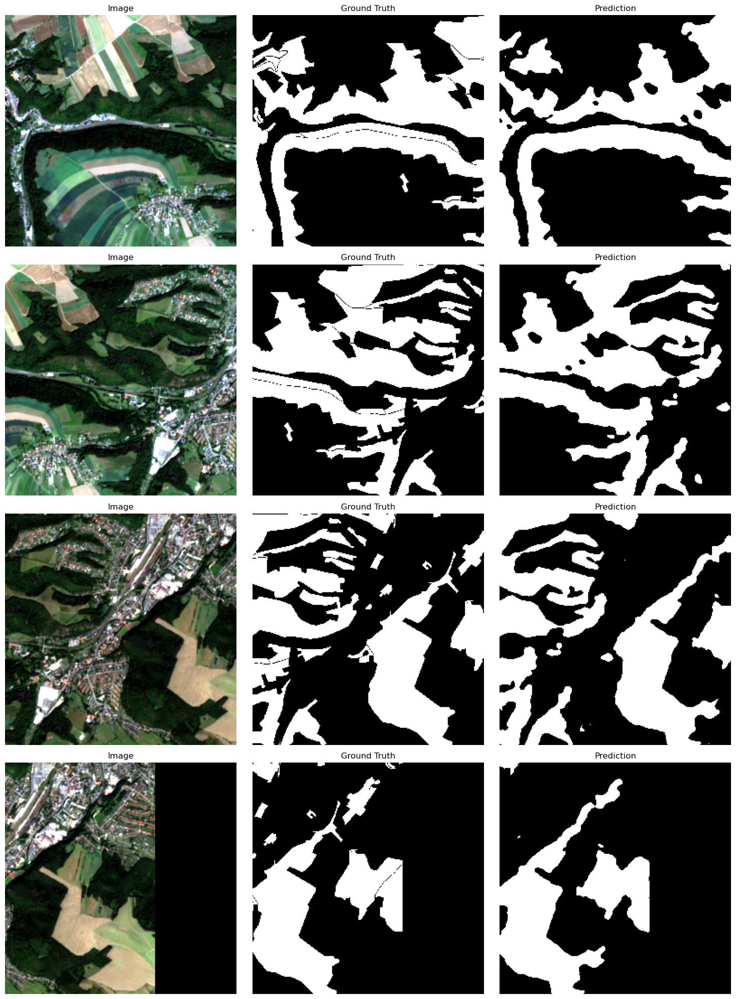

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 1.0
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 0.9147540926933289


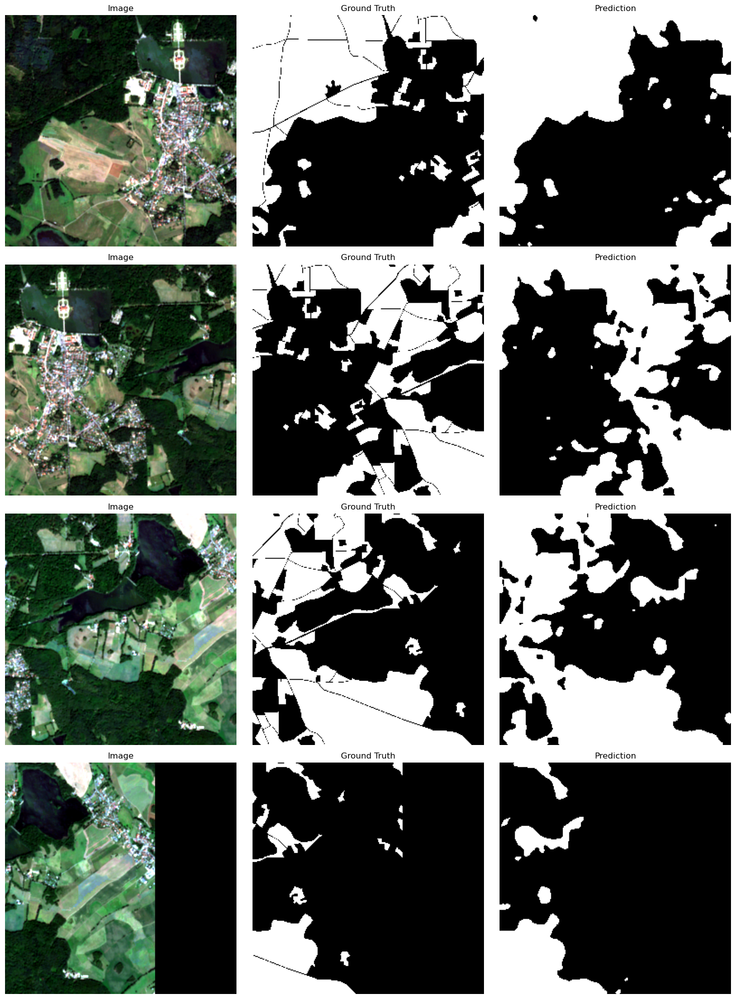

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 0.9648628830909729
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 0.9472852647304517
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 0.9371521413326246
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 0.7634190988540606


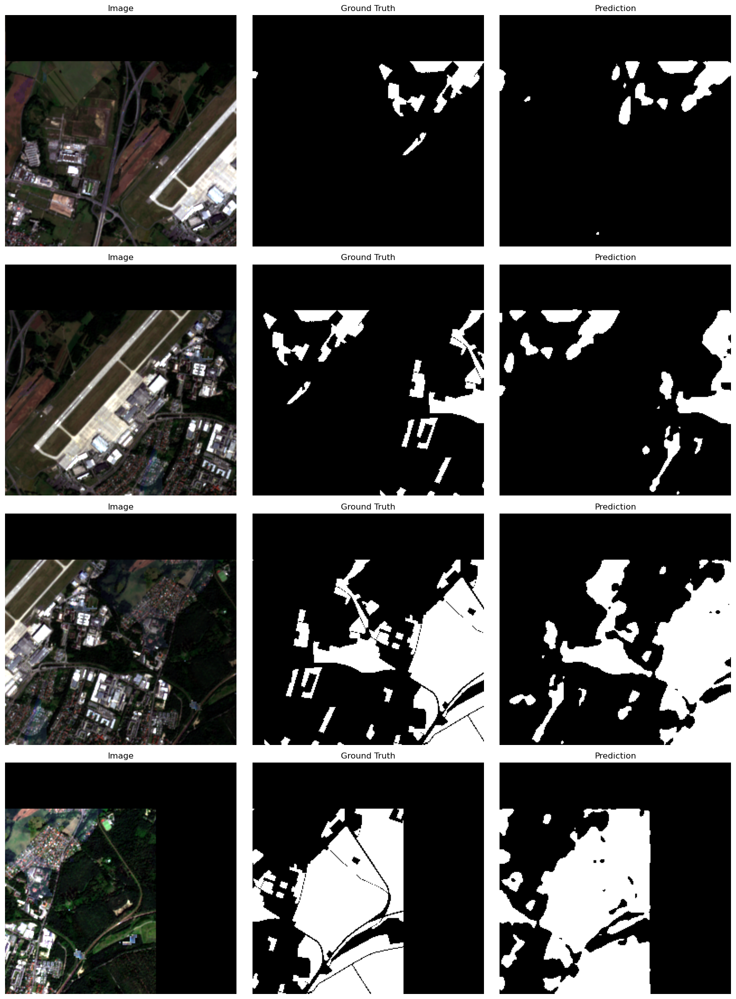

Prediction shape: torch.Size([12, 2, 256, 256])
Mask shape: torch.Size([12, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 1.0
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
0.0 0.8494921922683716


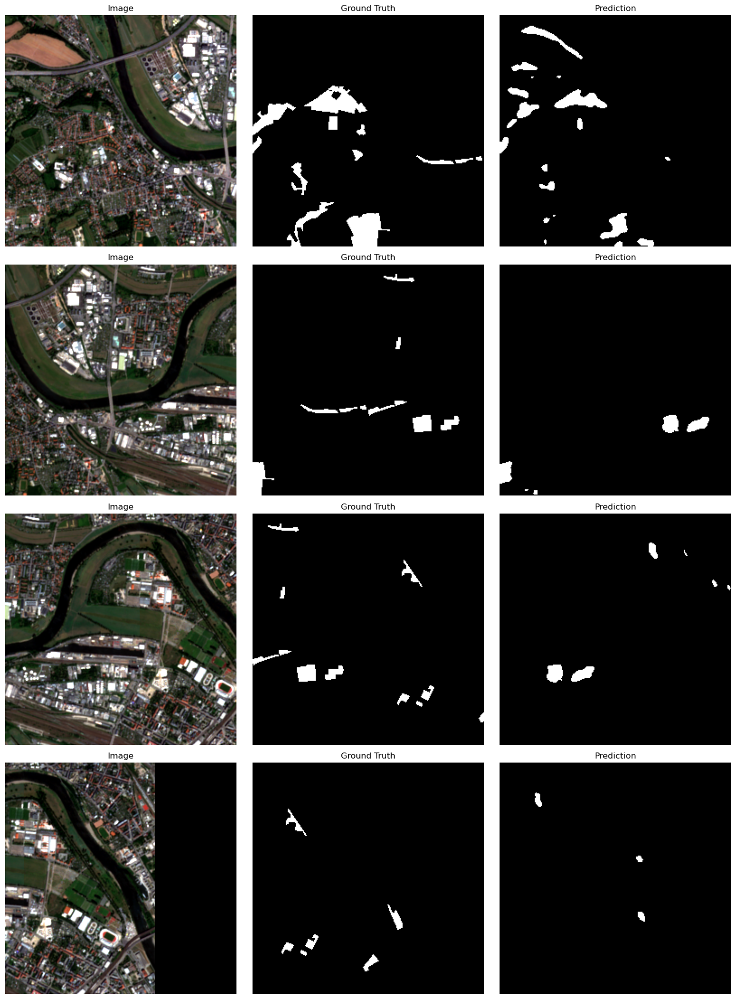

In [39]:
# visualize_predictions_test(task, test_loader, mode='additional', replace_band_pos=[13])
visualize_predictions_test(task, test_loader, mode='original')

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


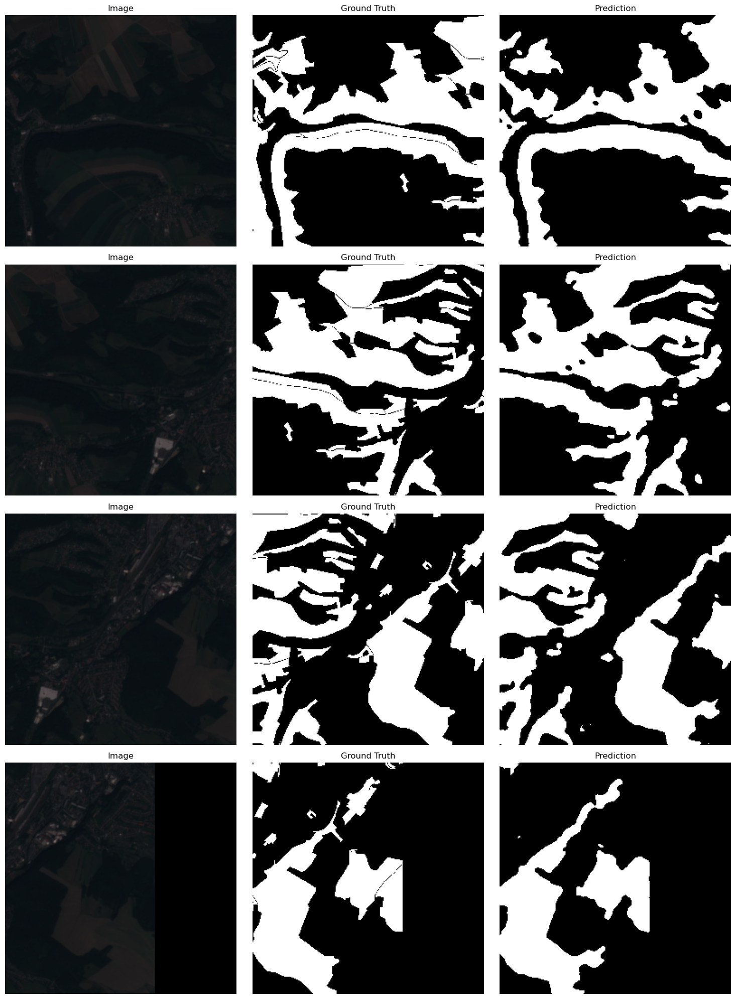

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


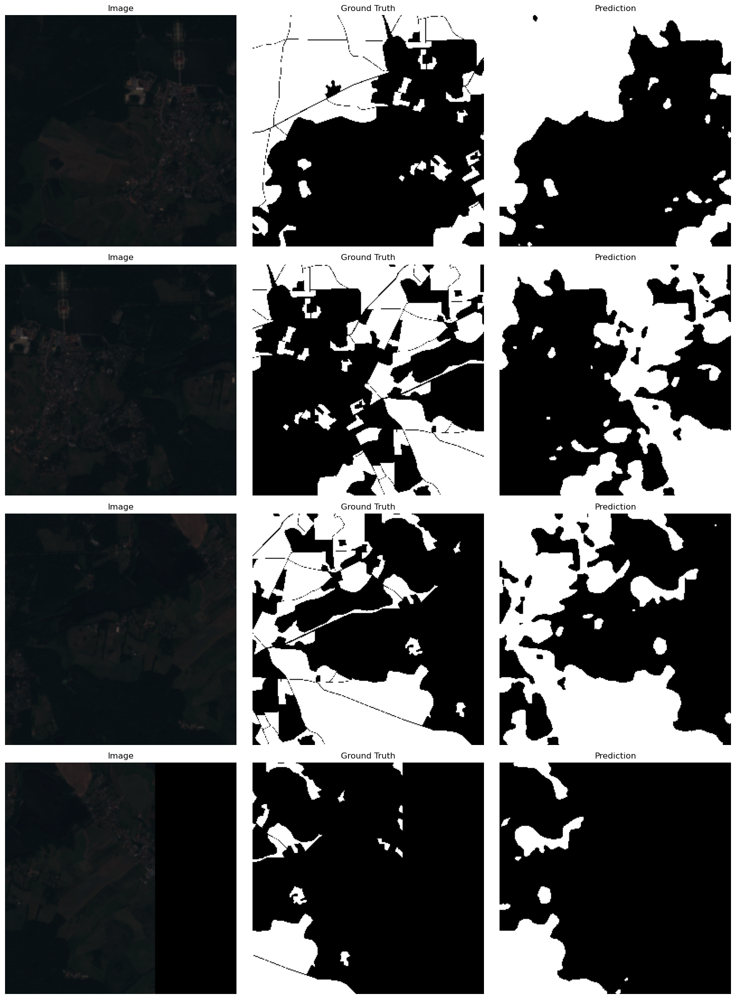

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


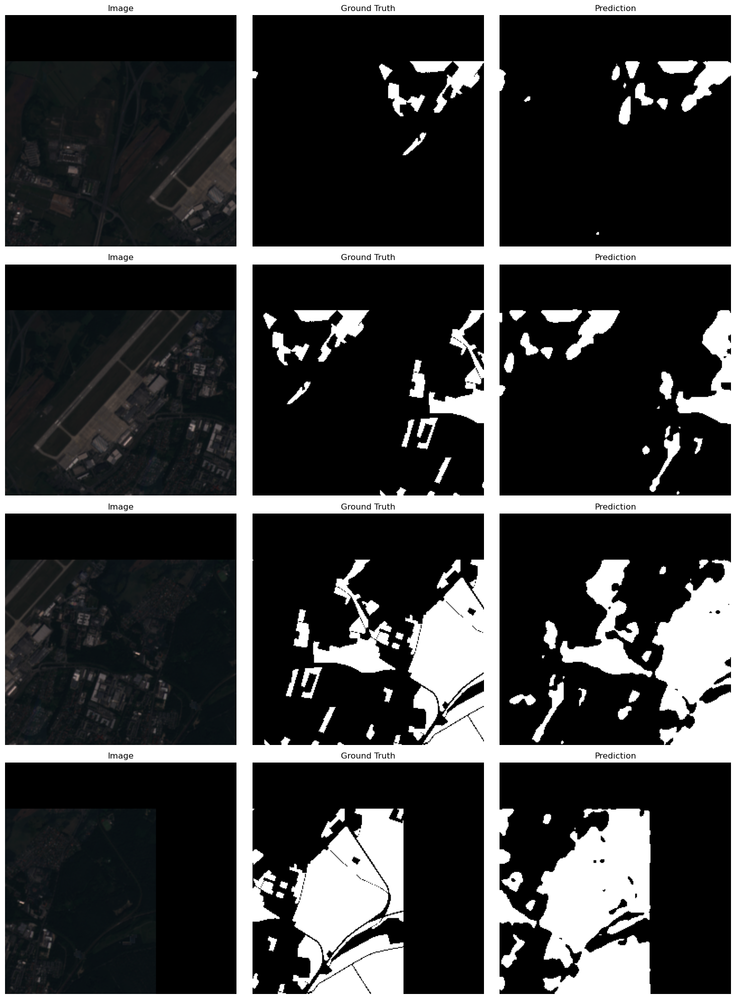

Prediction shape: torch.Size([12, 2, 256, 256])
Mask shape: torch.Size([12, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


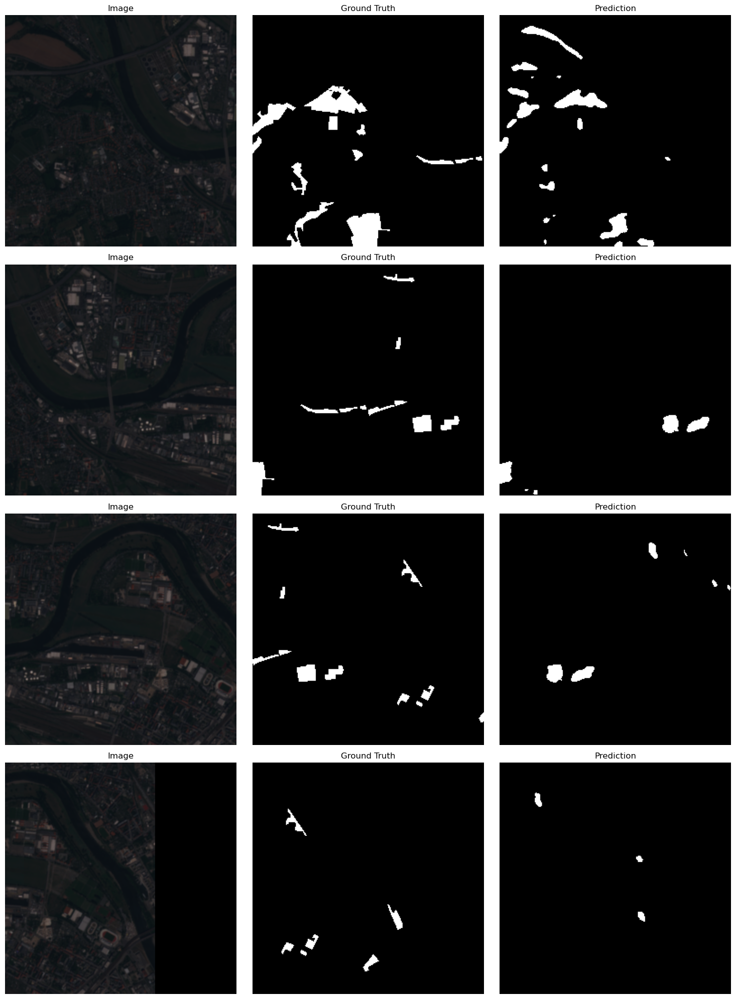

In [40]:
# visualize_predictions(task, test_loader, mode='additional', replace_band_pos=[13])
visualize_predictions(task, test_loader, mode='original')

# load model from checkpoint

In [ ]:
# Path to your checkpoint file
checkpoint_path = "/root/pugs_detection/notebooks/lightning_logs/version_26/checkpoints/epoch=14-step=975.ckpt"

# Direct loading with the correct channel count
model = SemanticSegmentationTask.load_from_checkpoint(
    checkpoint_path,
    in_channels=10  # Match what's in the checkpoint
)

In [6]:
# trainer.test(model=model, dataloaders=test_loader)

# Test predict whole area

In [7]:
# Use custom collate function to maintain window_ifo as list of tuples
# so we can easily extract the window coordinates
def custom_collate_fn(batch):
    """Keep window coordinates as a list of tuples instead of tensors"""
    images = torch.stack([torch.from_numpy(item["image"]) for item in batch])
    window_infos = [item["window_info"] for item in batch]
    
    return {
        "image": images,
        "window_info": window_infos
    }

In [8]:
# band_list_predict = [0,1,2,3,4,5,6,7,8,9,10,11,12,13] # 13 is osm binary mask
# band_list_predict = [0,1,2,3,4,5,6,7,8,9,10,11,12] # 13 is osm binary mask
band_list_predict = [1,2,3,4,5,6,7,11,12,13]

In [9]:
import torch
import numpy as np
import rasterio
from torch.utils.data import Dataset, DataLoader
from rasterio.windows import Window
from tqdm.auto import tqdm

class LargeImageDataset(Dataset):
    def __init__(self, image_path, patch_size=256, stride=256):
        self.image_path = image_path
        self.patch_size = patch_size
        self.stride = stride
        
        # Open the image to get dimensions
        with rasterio.open(image_path) as src:
            self.height = src.height
            self.width = src.width
            self.count = src.count
            self.transform = src.transform
            self.crs = src.crs

        # Create list of windows - all using Window objects
        self.windows = []
        for y in range(0, self.height - patch_size + 1, stride):
            for x in range(0, self.width - patch_size + 1, stride):
                self.windows.append(Window(x, y, patch_size, patch_size))

        # Edge patches along bottom
        if self.height % stride != 0:
            last_y = self.height - patch_size
            for x in range(0, self.width - patch_size + 1, stride):
                self.windows.append(Window(x, last_y, patch_size, patch_size))

        # Edge patches along right side
        if self.width % stride != 0:
            last_x = self.width - patch_size
            for y in range(0, self.height - patch_size + 1, stride):
                self.windows.append(Window(last_x, y, patch_size, patch_size))

        # Corner patch (if needed)
        if self.width % stride != 0 and self.height % stride != 0:
            self.windows.append(Window(self.width - patch_size, 
                                    self.height - patch_size,
                                    patch_size, patch_size))
               
    def __len__(self):
        return len(self.windows)
    
    def __getitem__(self, idx):
        window = self.windows[idx]
        
        with rasterio.open(self.image_path) as src:
            # Read image data for this window
            image = src.read(window=window)
            # image = image[0:14, :, :]  # Select specific bands
            image = image[band_list_predict] # Select specific bands
            
        return {
            "image": image,
            "window_info": window  # Store coordinates as tuple
        }

# Regular DataLoader without custom collate function
inference_dataset = LargeImageDataset(image_path, patch_size=256, stride=256)
# Regular DataLoader WITH custom collate function
inference_loader = DataLoader(
    inference_dataset, 
    batch_size=4, 
    num_workers=4,
    collate_fn=custom_collate_fn  # Use our custom collate
)
# Create output array
prediction_map = np.zeros((inference_dataset.height, inference_dataset.width), dtype=np.float32)
counts = np.zeros((inference_dataset.height, inference_dataset.width), dtype=np.float32)

# Process all patches
model.eval()
with torch.no_grad():
    for batch in tqdm(inference_loader):
        # Get images and window info
        images = batch["image"].to(model.device)
        windows = batch["window_info"]
        
        # Run inference
        outputs = model(images)
        probs = torch.sigmoid(outputs)
        preds = (probs > 0.5).float()
        
        # Process each patch in the batch
        # Process each patch in the batch
        for i, window in enumerate(windows):
            # Get window coordinates
            x_off = window.col_off
            y_off = window.row_off
            width = window.width
            height = window.height
            
            # Get prediction for this patch
            pred = probs[i].squeeze().cpu().numpy()
            # Ensure prediction is 2D for plotting
            if pred.ndim > 2:
                if pred.shape[0] == 1:
                    # Single channel but in shape (1, H, W)
                    pred = pred.squeeze(0)
                else:
                    pred = pred[1]
            # Add to output array
            prediction_map[y_off:y_off+height, x_off:x_off+width] += pred
            counts[y_off:y_off+height, x_off:x_off+width] += 1

# Average overlapping predictions
with np.errstate(divide='ignore', invalid='ignore'):
    prediction_map = np.divide(prediction_map, counts)
    prediction_map = np.nan_to_num(prediction_map)

# Save the prediction
with rasterio.open(
    'pugs_prediction_osm_additional_v26.tif', 
    'w',
    driver='GTiff',
    height=inference_dataset.height,
    width=inference_dataset.width,
    count=1,
    dtype=rasterio.float32,
    crs=inference_dataset.crs,
    transform=inference_dataset.transform
) as dst:
    dst.write(prediction_map[np.newaxis, :, :])

100%|██████████| 25/25 [00:07<00:00,  3.42it/s]


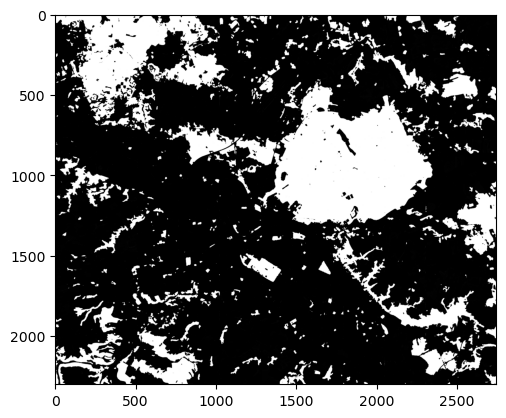

In [10]:
image_path = 'pugs_prediction_osm_additional_v26.tif'

open_image = rasterio.open(image_path)
image = open_image.read(1)
plt.imshow(image, cmap='gray')
open_image.close()